In [8]:
import zipfile
import os

# Define the path to the zip file and where to extract it
zip_path = '/content/painting.zip'  # Ensure this is the correct path
extract_path = '/content/paintings'

# Attempt to unzip the file
try:
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        zip_ref.extractall(extract_path)
    print("Extraction complete.")
except zipfile.BadZipFile:
    print("Error: The file specified is not a valid zip file.")
except FileNotFoundError:
    print(f"Error: The file at {zip_path} does not exist.")
except Exception as e:
    print(f"An unexpected error occurred: {e}")


Extraction complete.


In [9]:
import os

# Define the directory where you expect to find the images
directory_path = '/content/paintings/painting'  # Adjust the path if needed

# Print out the files in the directory
for root, dirs, files in os.walk(directory_path):
    for file in files:
        print(os.path.join(root, file))


/content/paintings/painting/1999.jpg
/content/paintings/painting/1503.jpg
/content/paintings/painting/1316.jpg
/content/paintings/painting/1445.jpg
/content/paintings/painting/1623.jpg
/content/paintings/painting/0273.jpg
/content/paintings/painting/1315.jpg
/content/paintings/painting/1194.jpg
/content/paintings/painting/1683.jpg
/content/paintings/painting/0394.jpg
/content/paintings/painting/1770.jpg
/content/paintings/painting/1166.jpg
/content/paintings/painting/0226.jpg
/content/paintings/painting/0499.jpg
/content/paintings/painting/0685 20.26.31.jpg
/content/paintings/painting/0146.jpg
/content/paintings/painting/1979.jpg
/content/paintings/painting/1587.jpg
/content/paintings/painting/1142.jpg
/content/paintings/painting/1110.jpg
/content/paintings/painting/1289.jpg
/content/paintings/painting/0921.jpg
/content/paintings/painting/0256.jpg
/content/paintings/painting/2040.jpg
/content/paintings/painting/1184.jpg
/content/paintings/painting/0578.jpg
/content/paintings/painting/0

553467096/553467096 [==============================] - 7s 0us/step
Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                            

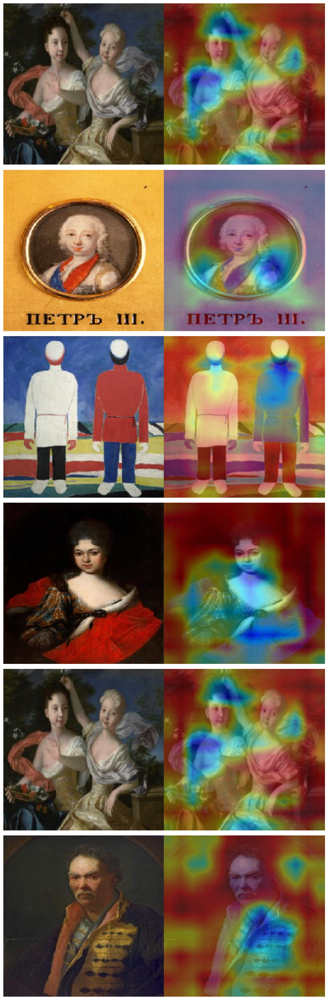

In [10]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Model
import cv2
import matplotlib.pyplot as plt

# Load VGG16 model
model = VGG16(weights='imagenet')
model.summary()

# Define the last convolutional layer for Grad-CAM
layer_name = 'block5_conv3'
grad_model = Model(inputs=model.inputs, outputs=[model.get_layer(layer_name).output, model.output])

# Function to load and preprocess image
def load_image(img_path):
    img = image.load_img(img_path, target_size=(224, 224))
    img = image.img_to_array(img)
    img = np.expand_dims(img, axis=0)
    return preprocess_input(img)

# Function to generate Grad-CAM heatmap
def generate_heatmap(img_array, class_idx):
    img_array = tf.convert_to_tensor(img_array)  # Ensure array is a tensor
    with tf.GradientTape() as tape:
        tape.watch(img_array)
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, class_idx]

    grads = tape.gradient(loss, conv_outputs)[0]
    guided_grads = grads * tf.cast(grads > 0, dtype=tf.float32)
    weights = tf.reduce_mean(guided_grads, axis=(0, 1))

    cam = np.dot(conv_outputs[0], weights.numpy())
    cam = cv2.resize(cam, (224, 224), cv2.INTER_LINEAR)
    cam = np.maximum(cam, 0)
    heatmap = (cam - cam.min()) / (cam.max() - cam.min())
    heatmap = np.uint8(255 * heatmap)
    return cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

# List of images to apply Grad-CAM
image_files = [
    '/content/paintings/painting/1040.jpg',
    '/content/paintings/painting/0832.jpg',
    '/content/paintings/painting/2280.jpg',
    '/content/paintings/painting/0710.jpg',
    '/content/paintings/painting/0965.jpg',
    '/content/paintings/painting/0541.jpg'
]

# Process and display each image with its heatmap
fig, axs = plt.subplots(len(image_files), 2, figsize=(10, 5 * len(image_files)))

for i, img_file in enumerate(image_files):
    img_path = img_file
    if not os.path.exists(img_path):
        print(f"File {img_file} does not exist.")
        continue
    img_array = load_image(img_path)
    predictions = model.predict(img_array)
    class_idx = np.argmax(predictions)
    print(f"Predictions for {img_file}: {predictions}")
    heatmap = generate_heatmap(img_array, class_idx)

    # Original image
    img = image.load_img(img_path, target_size=(224, 224))
    axs[i, 0].imshow(img)
    axs[i, 0].axis('off')

    # Heatmap on image
    img = cv2.imread(img_path)
    img = cv2.resize(img, (224, 224))
    superimposed_img = cv2.addWeighted(img, 0.6, heatmap, 0.4, 0)
    axs[i, 1].imshow(superimposed_img)
    axs[i, 1].axis('off')

plt.tight_layout()
plt.show()


Extraction complete.
Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_11 (InputLayer)       [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 230, 230, 3)          0         ['input_11[0][0]']            
                                                                                                  
 conv1_conv (Conv2D)         (None, 112, 112, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 112, 112, 64)         256       ['conv1_conv[0][0]']          
 on)                                                                  

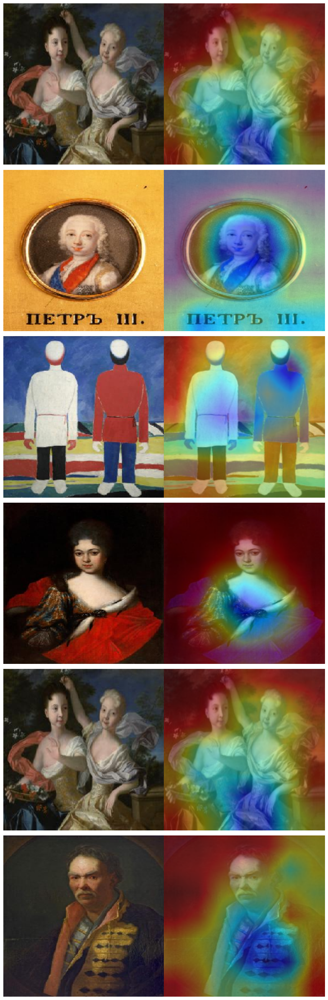

Model: "resnet152"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_12 (InputLayer)       [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 230, 230, 3)          0         ['input_12[0][0]']            
                                                                                                  
 conv1_conv (Conv2D)         (None, 112, 112, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 112, 112, 64)         256       ['conv1_conv[0][0]']          
 on)                                                                                      

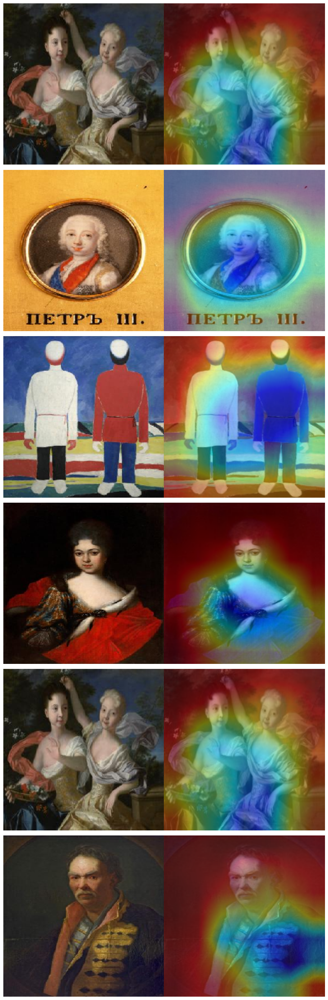

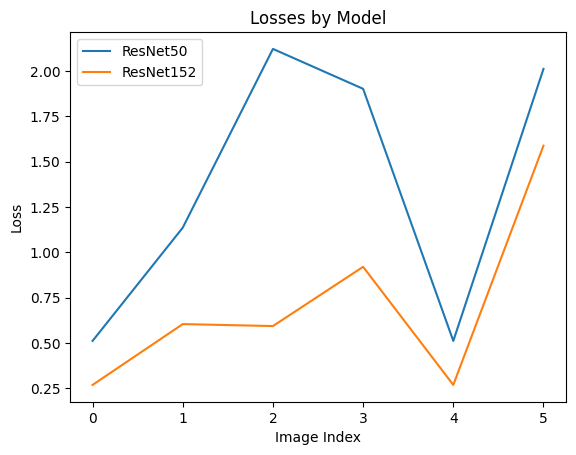

In [21]:
import zipfile
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import ResNet50, ResNet152
from tensorflow.keras.applications.resnet50 import preprocess_input  # Adjusted import
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Model
import cv2
import matplotlib.pyplot as plt

# Define the path to the zip file and where to extract it
zip_path = '/content/painting.zip'
extract_path = '/content/paintings'

# Unzip the file
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)
print("Extraction complete.")

# Function to load and preprocess image
def load_image(img_path):
    img = image.load_img(img_path, target_size=(224, 224))
    img = image.img_to_array(img)
    img = np.expand_dims(img, axis=0)
    return preprocess_input(img)

# Function to generate Grad-CAM heatmap
def generate_heatmap(img_array, model, grad_model, class_idx):
    img_array = tf.convert_to_tensor(img_array)  # Ensure array is a tensor
    with tf.GradientTape() as tape:
        tape.watch(img_array)
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, class_idx]

    output = conv_outputs[0]
    grads = tape.gradient(loss, conv_outputs)[0]
    guided_grads = grads * tf.cast(grads > 0, dtype=tf.float32)
    weights = tf.reduce_mean(guided_grads, axis=(0, 1))

    cam = np.dot(output, weights.numpy())
    cam = cv2.resize(cam, (224, 224), cv2.INTER_LINEAR)
    cam = np.maximum(cam, 0)
    heatmap = (cam - cam.min()) / (cam.max() - cam.min())
    heatmap = np.uint8(255 * heatmap)
    return cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

# List of ResNet models to use
models = {
    'ResNet50': ResNet50(weights='imagenet'),
    'ResNet152': ResNet152(weights='imagenet')
}

# List of images to apply Grad-CAM
image_files = [
    '/content/paintings/painting/1040.jpg',
    '/content/paintings/painting/0832.jpg',
    '/content/paintings/painting/2280.jpg',
    '/content/paintings/painting/0710.jpg',
    '/content/paintings/painting/0965.jpg',
    '/content/paintings/painting/0541.jpg'
]

losses = {}

# Iterate over each model
for model_name, model in models.items():
    model.summary()

    # Define the last convolutional layer for Grad-CAM
    layer_name = 'conv5_block3_out' if 'ResNet' in model_name else 'block5_conv3'
    grad_model = Model(inputs=model.inputs, outputs=[model.get_layer(layer_name).output, model.output])

    # Process and display each image with its heatmap
    fig, axs = plt.subplots(len(image_files), 2, figsize=(10, 5 * len(image_files)))
    model_losses = []

    for i, img_file in enumerate(image_files):
        img_path = os.path.join(extract_path, img_file)
        if not os.path.exists(img_path):
            print(f"File {img_file} does not exist.")
            continue
        img_array = load_image(img_path)
        predictions = model.predict(img_array)
        class_idx = np.argmax(predictions)
        print(f"Predictions for {img_file} using {model_name}: {predictions}")
        heatmap = generate_heatmap(img_array, model, grad_model, class_idx)

        loss = tf.keras.losses.CategoricalCrossentropy()(tf.one_hot([class_idx], predictions.shape[1]), predictions).numpy()
        model_losses.append(loss)

        # Original image
        img = image.load_img(img_path, target_size=(224, 224))
        axs[i, 0].imshow(img)
        axs[i, 0].axis('off')

        # Heatmap on image
        img = cv2.imread(img_path)
        img = cv2.resize(img, (224, 224))
        superimposed_img = cv2.addWeighted(img, 0.6, heatmap, 0.4, 0)
        axs[i, 1].imshow(superimposed_img)
        axs[i, 1].axis('off')

    plt.tight_layout()
    plt.show()

    losses[model_name] = model_losses

# Plot the losses
for model_name, model_losses in losses.items():
    plt.plot(model_losses, label=model_name)

plt.title('Losses by Model')
plt.xlabel('Image Index')
plt.ylabel('Loss')
plt.legend()
plt.show()


In [22]:
import os
from PIL import Image

# Define the path to the directory containing the images
dir_path = '/content/paintings/painting'

# List to store the paths of all image files
image_files = []

# Walk through the directory
for root, dirs, files in os.walk(dir_path):
    for file in files:
        if file.endswith(".jpg"):  # Check if the file is a JPEG image
            image_path = os.path.join(root, file)
            if '__MACOSX' not in image_path:  # Exclude any macOS system files
                image_files.append(image_path)

# Now, image_files list contains all the paths of JPEG images in the 'painting' directory
print("Found", len(image_files), "images.")

# Example processing: Opening and showing the first 5 images
for image_path in image_files[:5]:  # Change the slice if you want to process more images
    with Image.open(image_path) as img:
        img.show()  # This will open the image in a popup
        # You can perform other processing on the image here


Found 2128 images.
